# 2024 METROAGRIFOR PAPER  to test RGBD performance in positioning apples for digital twin data population
&copy; G.Bortolotti, M. Piani

# Analyzing  picture of SIze and positioning trial  2D e 3D

# NO sizing at the submission




# DATA EXTRACTION

In [1]:
# modules
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
import json
import pandas as pd

### initialize wanted paths

### get depth / other file path based on RGB/labels ones  [PUTTING ALL FILES IN THE SAME FOLDER]

In [2]:
def get_rel_fns(rgb_img, depth_path):
    '''
    The function detects related files from different directories

    :param rgb_img: rgb target image
    :param therm_path: raw thermal aligned directory
    :param depth_path: depth matrix directory
    :return: img_name_therm, image_code, img_name_depth, img_name_therm_aligned
            # thermal image fn
            # image identifier
            # related depth path/filename
            # related aligned therm path/filename
    '''

    # image name string
    a = rgb_img
    len_ = len(a)

    # loop
    for i in range(0, len_):
        loc = a[len_ - i:len_]

        if loc.find("\\") != -1:  # if != "-1" the chr was found
            index = len_ - i
            stop_idx = a.find('_img_')
            # get image identifier
            image_code = str(a[index + 1:-4])
            # get thermal image fn
            # img_name_therm = therm_path + '\\' + \
            #                  str(a[index + 1:stop_idx]) + \
            #                  '_thermal_' + \
            #                  str(a[stop_idx+5:-4]) + ".PNG"

            # get depth image fn
            img_name_depth = depth_path + '\\' + \
                             str(a[index + 1:stop_idx]) + \
                             '_depth_' + \
                             str(a[stop_idx+5:-4]) + "png"

            # get thermal aligned image fn
            # img_name_therm_aligned = therm_path +'\\'+ \
            #                          str(a[index + 1:stop_idx]) + \
            #                          '_thermal_' + \
            #                          str(a[stop_idx+5:-4]) + "_aligned.PNG"

            return image_code, img_name_depth, 
        else:
            pass

## Working with .json SLY yolo labels

### Labels extraction --> from SLY .json to pd.DF (absolute e relative coords)

In [3]:
def process_supervisely_json(json_path):
    # Step 1: Read Supervisely JSON file
    with open(json_path, 'r') as file:
        supervisely_data = json.load(file)

    # Step 2: Extract Annotations Data
    # Extract img info as size:
    img_h = supervisely_data['size']['height']
    img_w = supervisely_data['size']['width']
    # print('image H x W:', img_h, 'x', img_w)
# 
    annotations = supervisely_data['objects']

    # Step 3: Create a List of Dictionaries
    annotations_list = []

    for annotation in annotations:
        x1, y1 = annotation['points']['exterior'][0]
        x2, y2 = annotation['points']['exterior'][1]
        w, h = x2 - x1, y2 - y1
        x_c = round(x1 + w / 2)
        y_c = round(y1 + h / 2)

        # Relative coordinates:
        w_r, x_c_r, h_r, y_c_r = w / img_w, x_c / img_w, h / img_h, y_c / img_h
        w_r, x_c_r, h_r, y_c_r = round(w_r, 6), round(x_c_r, 6), round(h_r, 6), round(y_c_r, 6)

        annotation_dict = {
            'Tag': annotation['description'],
            'label': annotation['classTitle'],
            'img_w':img_w,
            'img_h':img_h,
            # 'bbox': annotation['points']['exterior'],
            # 'bbox0': annotation['points']['exterior'][0],
            # 'bbox1': annotation['points']['exterior'][1],
            'x_1' :x1, 'y_1':y1, 'x_2' :x2,'y_2':y2,'x_c_abs' :x_c,'y_c_abs':y_c,'w_abs' :w,'h_abs' :h,
        }
        annotations_list.append(annotation_dict)

    # Step 4: Convert List to DataFrame
    df_annotations = pd.DataFrame(annotations_list)

    #compute relatove bbox coord:
    df_annotations['x_c_rel'] = df_annotations['x_c_abs'] / df_annotations['img_w']
    df_annotations['y_c_rel'] = df_annotations['y_c_abs'] / df_annotations['img_h']
    df_annotations['w_rel'] = df_annotations['w_abs'] / df_annotations['img_w']
    df_annotations['h_rel'] = df_annotations['h_abs'] / df_annotations['img_h']

    # Display the DataFrame
    # display(df_annotations)

    # print(f'\nunique labels:\n{df_annotations.label.unique()}')
    return(df_annotations)
# Example Usage:
# Replace 'your_json_file_path.json' with the actual path to your JSON file
# json_file_path = glob.glob(FRUIT_DETECT_YOLO_LABELS_PATH + '\\*' + '.json')
# df_test_json_lab = process_supervisely_json(json_file_path[0])

def yolo_coords_json(df):
    '''
    The function extracts the YOLO bbox coordinates from label df rows
    :param df: YOLO txt df row with bbox info
    :return: x_c, y_c, w, h, lab
    '''
    x_min = df['x_1']
    y_min = df['y_1']
    w = df['w_abs']
    h = df['h_abs']
    lab = df['label']

    return x_c, y_c, w, h, lab
# Example Usage:
# yolo_coords_json(df_test_json_lab)

### Def function to compute fruit position

In [4]:
def xyz_positioning_json(depth, row, trunk_d_img, trunk_coords, ORIENTATION):
    '''
    The function computes the 3D positioning of detected objects
    :param depth: depth image
    :param row: fruit Dbbox coordinates (i.e., AOI)
    :param trunk_coords: trunk coords dict {'x_c': x_trunk, 'y_c': y_trunk, 'z': z_trunk}
    :return:
            xc2 = relative fruit centre X coord in millimetres with respect to the trunk
            yc2 = relative fruit centre Y coord in millimetres with respect to the trunk
            zc = fruit distance in millimetres with respect to 'z_trunk_real' detected from the Dbbox
            z_trunk = trunk distance from camera
            
            d_linear =  linear distance between fruit centre and trunk position (pixels)

            a = fruit radious on X: ellipsoid r/2
            b = fruit radious on Y: ellipsoid r/2
            c = fruit radious on Z: ellipsoid r/2

            zc2 = fruit distance in millimetres aligned to 'z_trunk'
    '''
    
    # getting TRUNK to camera distance computed before
    trunk_img = trunk_d_img
    x_trunk, y_trunk, z_trunk = trunk_coords['x_c'], trunk_coords['y_c'], trunk_coords['z']
    # print(f'{x_trunk , y_trunk, z_trunk= }')

    # ----CLIPPING FRUIT BBOX on the depth image
    depth = np.array(depth)
    im_np = np.array(depth).astype('float64')
    im_w, im_h = row['img_w'] , row['img_h']

    # getting fruit bbox coords 
    x1 , x2 = row['x_1'] , row['x_2'] 
    y1 , y2 = row['y_1'] , row['y_2']
    x_c , y_c = row['x_c_abs'] , row['y_c_abs'] 
    w , h = row['w_abs'] ,  row['h_abs'] 
    # clipping fruit D_BBOX
    fruit_d_img = im_np[y1:y2, x1:x2]

    #----GETTING FRUIT DISTANCE
    # using a standard median
    m_fd_med = round(np.nanmedian(fruit_d_img))# using a standard median
    m_fd_mean = round(np.nanmean(fruit_d_img))# using a standard median

    # Bortolotti et al., 2023 IEEE metroagrifor SHeet (highest frequencsy):
    unique_values, counts = np.unique(fruit_d_img.flatten(), return_counts=True)
    max_count = np.max(counts)
    frequent_values = unique_values[counts == max_count]

    if np.isnan(frequent_values[0]):
        # Get the second most frequent value
        second_max_count = np.sort(counts)[-2]  # Get the second highest frequency
        second_frequent_values = unique_values[counts == second_max_count]
        # Use the second most frequent value
        m_fd = int(second_frequent_values[0])
    else:
        # Use the most frequent value
        m_fd = int(frequent_values[0])
    # Bortolotti et al., 2023 ECPA // Mengoli et al., 2022 IEEE - sizing RGBD approach (halved bbox mean)
    # fruit_d_img2 = im_np[y_c - h//4 : y_c + h//4, x_c - w//4 : x_c + w//4]
    # m_fd = int(np.nanmean(fruit_d_img2) # Bortolotti / Mengoli et al. sizing RGBD approach (halved bbox mean)
    # print('camera to fruit dist', f'{m_fd= }')

    # TODO: cleaning depth data for < 10-15% distance occurrence --> mean or median on the filtered 
    #------

    #----DEFINIG PIXEL RESOLUTION in mm at m_fd chosen
    #Camera FOV degree (Intel Realsense D435i)
    if ORIENTATION == 'V': 
        HFOV = 42
        VFOV = 69
    elif ORIENTATION == 'H': 
        HFOV = 69
        VFOV = 42
    elif ORIENTATION == 'SQUARE_RES': 
        print('--!! ATTENTION !!-- CAMERA ORIENTATION IN SQUARE RESOLUTION')
    # print('camera orientation:' , ORIENTATION)
    
    # define the depth estimation wanted
    # z_c = m_fd  # mm
    # z_c = m_fd_mean  # mm
    z_c = m_fd_med  # mm


    #---- Compute pixel resolution as presented in Mengoli et al., 2022 IEEE - Online real time
    mm_pix = np.sqrt((4 * z_c**2 * np.tan(np.deg2rad(VFOV)/2)*np.tan(np.deg2rad(HFOV)/2))/(im_w * im_h))
    mm_pix = round(mm_pix,6)
    # print(f'{mm_pix= }')

    #---- Compute FRUIT DISTANCES FROM THE TRUNK
    real_z_distance_mm = int(round((y_c - y_trunk) * mm_pix * -1)) + 120 # including offset in the picture
    real_x_distance_mm = int(round((x_c - x_trunk) * mm_pix ))
    real_y_distance_mm = int(round((m_fd - z_trunk)))

    
    # TODO: EUCLIDEAN distance between fruit centre and trunk position?
    euclidean_dist = np.sqrt(((x_c - x_trunk) ** 2 + (y_c - y_trunk) ** 2)) * mm_pix
    # TODO: MANHATTAN DISTANCE?
    manhattan_dist = np.abs(real_x_distance_mm) + np.abs(real_y_distance_mm)

    return(mm_pix, m_fd,m_fd_med,m_fd_mean, real_x_distance_mm, real_y_distance_mm, real_z_distance_mm)

### Sizing FUnction [ !!  NOT USED !!]
Based on Bortolotti et al 2023 - ECPA RGBD Sizing // Manfrini Tatura

circle detection on the bbox detected 

In [25]:

def sizing_fruits(bgr,depth):
    
    # ---- EQUALIZE BGR (this for to compensate for to high and low light conditions)
    ycrcb = cv2.cvtColor(bgr, cv2.COLOR_BGR2YCrCb)
    ycrcb[:, :, 0] = cv2.equalizeHist(ycrcb[:, :, 0]) # equalize the histogram of the Y channel 
    equalized_bgr= cv2.cvtColor(ycrcb, cv2.COLOR_YCrCb2BGR) # convert back to RGB color-space from YCrCb
    gray = cv2.cvtColor(equalized_bgr, cv2.COLOR_BGR2GRAY) # 

    # -----------CLIPPING FRUIT BBOX on the bgr and depth image
    gray = np.array(gray)
    # gray_np = np.array(gray).astype('float64')
    depth = np.array(depth)
    im_np = np.array(depth).astype('float64')
    
    im_w, im_h = row['img_w'] , row['img_h'] 
    # getting fruit bbox coords 
    x1 , x2 = row['x_1'] , row['x_2'] 
    y1 , y2 = row['y_1'] , row['y_2']
    x_c , y_c = row['x_c_abs'] , row['y_c_abs'] 
    w , h = row['w_abs'] ,  row['h_abs'] 

    # ---- Original BBOX DIMENSION
    bbox_min = w 
    bbox_max = h
    if bbox_min > bbox_max:
        bbox_min, bbox_max = bbox_max, bbox_min
    bbox_ave =(bbox_min + bbox_max) / 2

    # clipping fruit BBOX 
    fruit_d_img = im_np[y1:y2, x1:x2]
    # enlarged bgr bbox of k% to improve circle detection
    k=0.1
    croppedbbox = gray[y1-int(h*k):y2+int(h*k), x1-int(w*k):x2+int(w*k)]
    mean_Circ_res_img = bgr[y1-int(h*k):y2+int(h*k), x1-int(w*k):x2+int(w*k)]
    CircDet_img = mean_Circ_res_img.copy()
    # cv2.imshow('CircDet_img', CircDet_img)
    # cv2.waitKey(500)
    # cv2.destroyAllWindows()
    #-----------------------------------------

    #------------------GETTING FRUIT DISTANCE
    # using a standard median
    m_fd_med = round(np.nanmedian(fruit_d_img))# using a standard median
    m_fd_mean = round(np.nanmean(fruit_d_img))# using a standard median

    # Bortolotti et al., 2023 IEEE metroagrifor SHeet (highest frequencsy):
    unique_values, counts = np.unique(fruit_d_img.flatten(), return_counts=True)
    max_count = np.max(counts)
    frequent_values = unique_values[counts == max_count]

    if np.isnan(frequent_values[0]):
        # Get the second most frequent value
        second_max_count = np.sort(counts)[-2]  # Get the second highest frequency
        second_frequent_values = unique_values[counts == second_max_count]
        # Use the second most frequent value
        m_fd = int(second_frequent_values[0])
    else:
        # Use the most frequent value
        m_fd = int(frequent_values[0])
    #--------------------------------------------
    
    #------------------DEFINIG PIXEL RESOLUTION in mm at m_fd chosen
    #Camera FOV degree (Intel Realsense D435i)
    HFOV = 69  # FOV degree
    VFOV = 42  # FOV degree
    z_c = m_fd  # mm
    #---- Compute pixel resolution as presented in Mengoli et al., 2022 IEEE - Online real time
    mm_pix = np.sqrt((4 * z_c**2 * np.tan(np.deg2rad(VFOV)/2)*np.tan(np.deg2rad(HFOV)/2))/(im_w * im_h))
    mm_pix = round(mm_pix,6)
    # print(f'{mm_pix= }')

    # ----- BBOX REAL DIMENSION
    bbox_min_mm = round(bbox_min * mm_pix) 
    bbox_max_mm = round(bbox_max * mm_pix)
    bbox_ave_mm = round(bbox_ave * mm_pix)

    #------------------------------------------------------  

    # ------------------------ DEFINE RULES FOR CIRCLE DETECTION :
    #  min e max radius based on bbox dimension:rmax= bboxmax/2; rmin= bbox min/2
    minr = croppedbbox.shape[0]/2
    maxr = croppedbbox.shape[1]/2
    if (croppedbbox.shape[1]<minr):
        minr = croppedbbox.shape[1]/2
        maxr = croppedbbox.shape[0]/2

    minr = round(minr*0.50) #0.51
    maxr = round(maxr*1) #0.99
    minr,maxr = int(minr+1),int(maxr-1)
    # print("MINR: "+str(minr)+" - MAXR: "+str(maxr))
    #------------------------------------------------------  

    # ------------------------------- CIRCLE DETECTION
    todetectimg = croppedbbox
    # todetectimg = blurred
    # todetectimg = threshOtsu
    # todetectimg = threshgaus

    param1 = 200
    ccx = 0
    ccy = 0
    crad = 0
    # cv2.imshow('grayscale',gray)
    # EX: cv2.HoughCircles(	image, method, dp, minDist[, circles[, param1[, param2[, minRadius[, maxRadius]]]]]	) ->	circles
    circles = cv2.HoughCircles(todetectimg,cv2.HOUGH_GRADIENT,1.5,round(minr/1.2),param1=param1,param2=30,minRadius=minr,maxRadius=maxr)
    if (type(circles) == type(None)):
        # print("Try alternate method") #print("ALTERNATE")
        circles = cv2.HoughCircles(todetectimg,cv2.HOUGH_GRADIENT_ALT,1.8,round(minr/1.2),param1=param1,param2=0.6,minRadius=minr,maxRadius=maxr)     
    #------------------------------------------------------  

    # ------------------ FILTERING OF THE DETECTED CIRCLES
    if (type(circles) != type(None)):
        circles = np.uint16(np.around(circles)) 
        # print("----------------------------------------------------UN-filtered_circles")
        # print(circles.shape)
        #print("Circles Found: ", len(circles[0]))
        #print(circles)

        #--defining rules for filtering detected circles      
        filtered_circles = []
        crop_bbox_widht, crop_bbox_height = croppedbbox.shape[0], croppedbbox.shape[1]
        crop_bbox_Xc, crop_bbox_Yc = (croppedbbox.shape[0]//2),  (croppedbbox.shape[1]//2)
        #--define_bbox_overplapping(OL)_areas
        OL_factor = 0.4 # 1= bbox dimension; 0.5 = bbox_dimensions//2 
        
        widht_center_shift, heigth_center_shift = round(crop_bbox_widht*OL_factor/2), round(crop_bbox_height* OL_factor/2)
        OLarea_Xmin, OLarea_Xmax = crop_bbox_Xc - widht_center_shift, crop_bbox_Xc + widht_center_shift
        OLarea_Ymin, OLarea_Ymax = crop_bbox_Yc-heigth_center_shift, crop_bbox_Yc+heigth_center_shift
        
        #--circles output: floating-point vector \f$(x, y, radius)\f$ or \f$(x, y, radius, votes)\f$    
        # print("----------------Filtering circles:")
        for circle_i in range(len(circles[0])):
            circ = circles[0][circle_i]
            circle_Xc =circ[0]
            circle_Yc =circ[1]
            # print("len(circles[0]): ", len(circles[0]))
            # print("filtered circle(+1): ", circle_i+1," - ", circ )
            # print("Xc: ",circle_Xc, "  Yc: ", circle_Yc, "  radius: ",circ[2])
            # print("Xmin:max - ", OLarea_Xmin, OLarea_Xmax,"  Ymin:max - ", OLarea_Ymin, OLarea_Ymax, "  Rmin:Rmax = ", minr,maxr)
            if circle_Xc >= OLarea_Xmin and  circle_Xc <= OLarea_Xmax:
                if  circle_Yc >= OLarea_Ymin and circle_Yc <= OLarea_Ymax:
                    # print(" --filtering passed!")
                    filtered_circles.append(circ)
                    
        # ------------ FILTERING RESULTS   
        filtered_circles =np.asarray(filtered_circles)
        # print("----------------------------------------------------filtered_circles")
        # print( "RULES: X-range min:max - ", OLarea_Xmin, OLarea_Xmax,"Yrange min:max - ", OLarea_Ymin, OLarea_Ymax, "Rmin:Rmax = ", minr,maxr, "bbox W, H ", )
        
        if len(filtered_circles) == 0:  
            # print("No circles respecting the filtering rules") #print("ALTERNATE")
            #if no circle is detected, setting values to None    
            fruit_size_circle = None  
            # cnt +=1

        elif len(filtered_circles)>0:
            # print("Circles Found respecting the rules: ", len(filtered_circles)) #len(filtered_circles[0])
            print(filtered_circles) #filtered_circles[0]
            
            ccx_L=[]
            ccy_L=[]
            crad_L=[]
            fruit_dist_sq_L=[]
            f_size_sq_L=[]
            fruit_dist_circ_L=[]
            f_size_circ_L=[]     

            for i in filtered_circles: #[0,:]
                # print("\n filt. circle: ", i, "\n")
                # cv2.circle(CircDet_img,(i[0],i[1]),i[2],(0,255,0),2)#-- draw the outer circle
                # cv2.circle(CircDet_img,(i[0],i[1]),2,(0,0,255),3)#-- draw the center of the circle
                # cv2.rectangle(CircDet_img,(OLarea_Xmin,OLarea_Ymin), (OLarea_Xmax,OLarea_Ymax),(255,0,0),2)#-- draw overlap center area
                # get circle x,y centers and radius
                ccx = i[0]
                ccy = i[1]
                crad = i[2]
                # define lists for results
                ccx_L.append(ccx)
                ccy_L.append(ccy)
                crad_L.append(crad)

            # ---------- FRUIT SIZING OF THE FILTERED CIRCLES
            #-- get mean fruit distance (from previous computation)
                z_position = m_fd #/1000
                distance_estimation_circle = round(z_position,2)
                # print("  mean_fruit_dist (mm): "+str(distance_estimation_circle)) #Z "APPLE ESTIMATION:"
            #-- get fruit size    
                size = crad * mm_pix
                fruit_size_circle = round(size*2,2)
                f_size_circ_L.append(fruit_size_circle)

                if fruit_size_circle == 0: 
                    fruit_size_circle=None
                # print("Fruit Size (mm): "+str(round(size,2))) #"APPLE CIRCLE SIZE (mm): "
                # print("  Fruit Size (mm): "+str(fruit_size_circle)) #"APPLE CIRCLE SIZE (mm): "

                fruit_dist_circ_L.append(distance_estimation_circle)
                f_size_circ_L.append(fruit_size_circle)

            #  get mean fruit size by averaging all remained circles
            ccx, ccy, crad = round(np.mean(ccx_L)), round(np.mean(ccy_L)), round(np.mean(crad_L))
            m_fd,fruit_size_circle  = m_fd, round(np.mean(f_size_circ_L),2)

            #-- draw the MEAN circles on RGB
            # cv2.circle(mean_Circ_res_img,(ccx,ccy),crad,(0,255,0),2) #MEAN outer circles
            # cv2.circle(mean_Circ_res_img,(ccx,ccy),2,(0,0,255),3) #MEAN center of the circles
            # cv2.rectangle(mean_Circ_res_img,(OLarea_Xmin,OLarea_Ymin), (OLarea_Xmax,OLarea_Ymax),(255,0,0),2) #overlap center area
            # -- draw the MEAN circles on Depth
            # cv2.circle(mean_both_depth_img,(ccx,ccy),(crad//2),(0,255,0),2) #MEAN outer circles
            # cv2.circle(mean_both_depth_img,(ccx,ccy),2,(0,0,255),3) #MEAN center of the circles
            # cv2.imshow('Image', mean_Circ_res_img)
            # cv2.waitKey(500)
            # cv2.destroyAllWindows()
    else:
        print("No_detect circles : No_detect circles") #print("ALTERNATE")
        #if no circle is detected, setting values to None    
        fruit_size_circle = None
    

    return(mm_pix, m_fd, m_fd_med,m_fd_mean,fruit_size_circle,bbox_ave_mm, bbox_min_mm, bbox_max_mm)   


### Whole Process based on SLY labels .json Files

Output filepath: C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Estimated_position_IEE_2024.csv
['C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_big_Black_img_2.png.json', 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_big_Black_img_3.png.json', 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_big_Black_img_4.png.json', 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_big_Leaves_img_2.png.json', 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\A

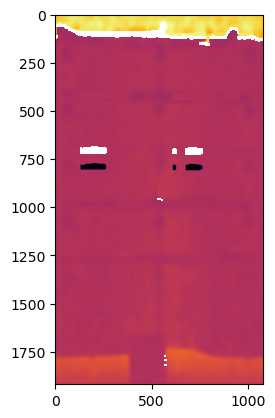

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

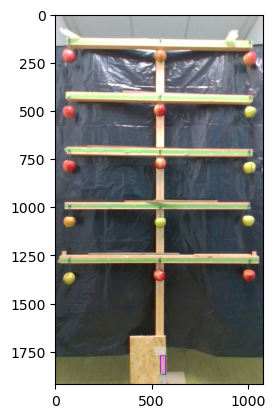

trunk coord - x, y, z : {'x_c': 547, 'y_c': 1869, 'z': 1531} pix  1531 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


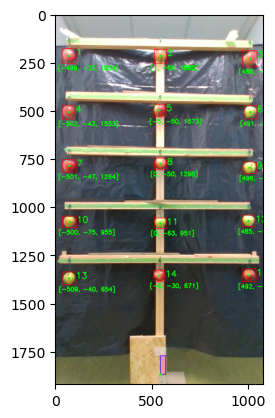

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_big_Black_img_3.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_big_Black_depth_3.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_big_Black_img_3.png


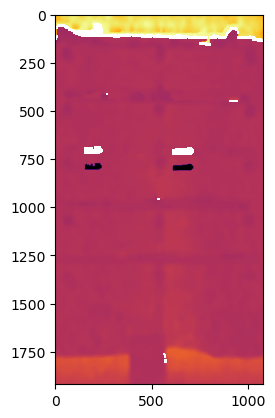

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

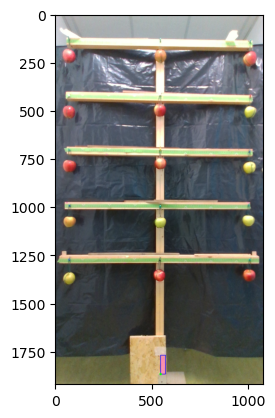

trunk coord - x, y, z : {'x_c': 548, 'y_c': 1868, 'z': 1517} pix  1517 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


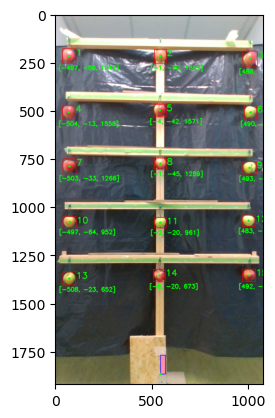

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_big_Black_img_4.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_big_Black_depth_4.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_big_Black_img_4.png


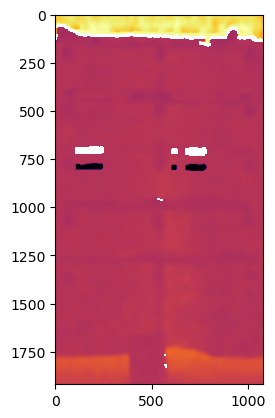

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

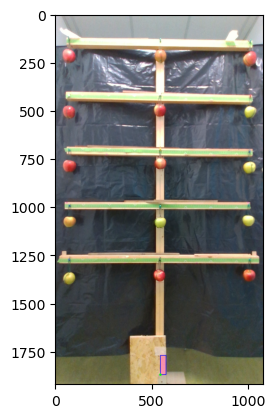

trunk coord - x, y, z : {'x_c': 547, 'y_c': 1871, 'z': 1535} pix  1535 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


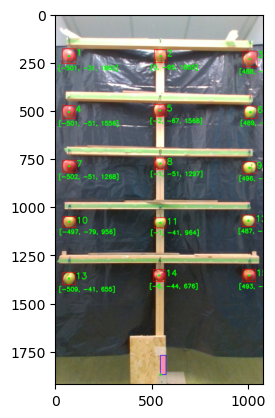

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_big_Leaves_img_2.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_big_Leaves_depth_2.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_big_Leaves_img_2.png


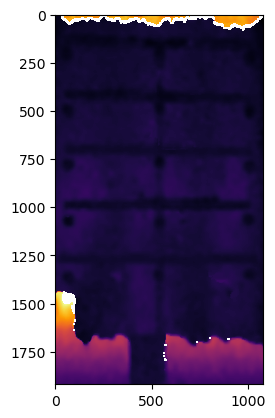

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

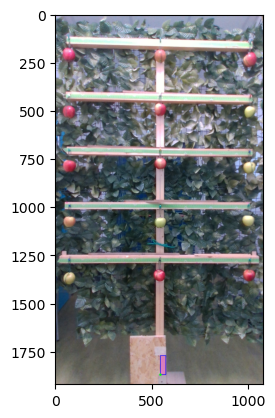

trunk coord - x, y, z : {'x_c': 547, 'y_c': 1871, 'z': 1542} pix  1542 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


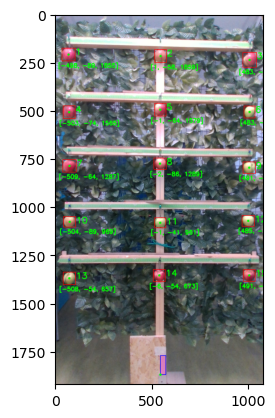

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_big_Leaves_img_3.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_big_Leaves_depth_3.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_big_Leaves_img_3.png


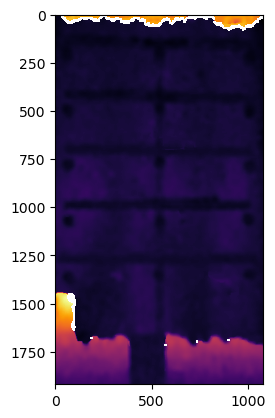

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

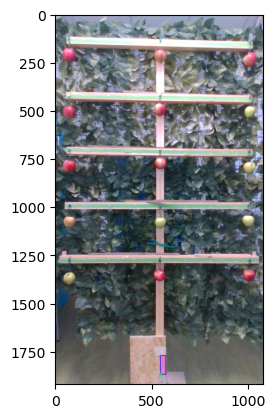

trunk coord - x, y, z : {'x_c': 547, 'y_c': 1869, 'z': 1517} pix  1517 mm
Sizing fruit obj_id= '1 '
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '7 '
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


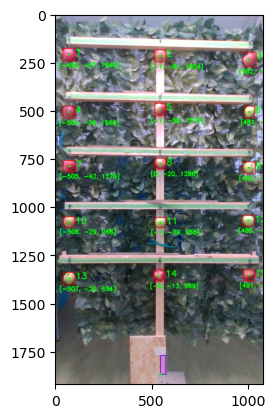

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_big_Leaves_img_4.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_big_Leaves_depth_4.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_big_Leaves_img_4.png


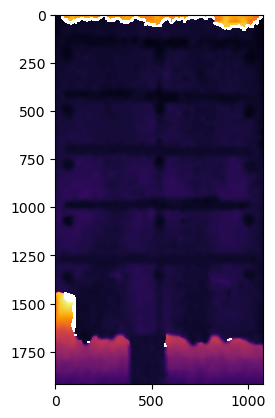

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

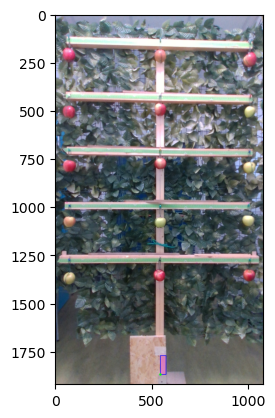

trunk coord - x, y, z : {'x_c': 547, 'y_c': 1870, 'z': 1545} pix  1545 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


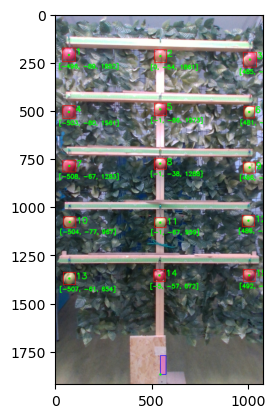

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_med_Black_img_2.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_med_Black_depth_2.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_med_Black_img_2.png


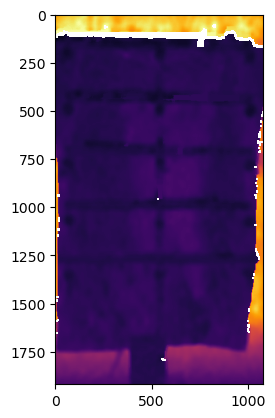

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

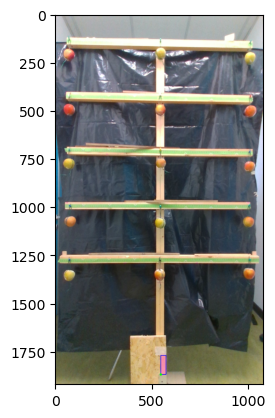

trunk coord - x, y, z : {'x_c': 549, 'y_c': 1870, 'z': 1511} pix  1511 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


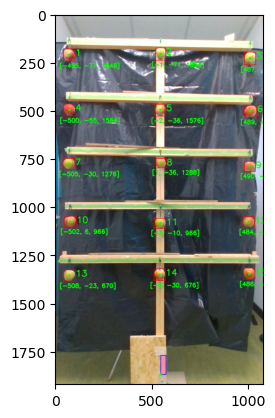

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_med_Black_img_3.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_med_Black_depth_3.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_med_Black_img_3.png


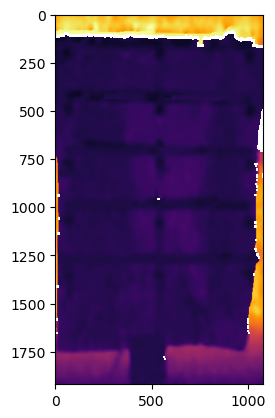

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

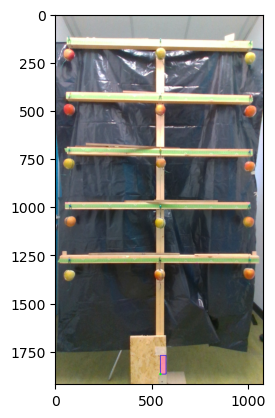

trunk coord - x, y, z : {'x_c': 547, 'y_c': 1868, 'z': 1535} pix  1535 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


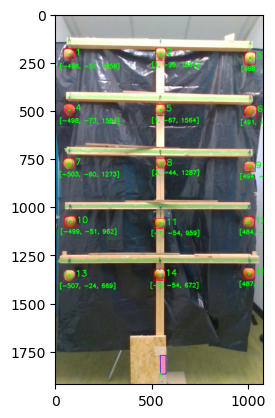

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_med_Black_img_4.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_med_Black_depth_4.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_med_Black_img_4.png


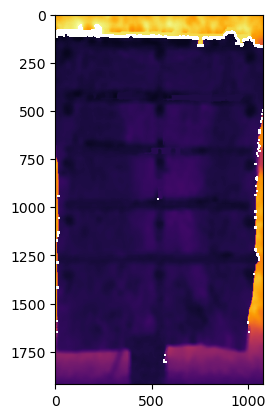

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

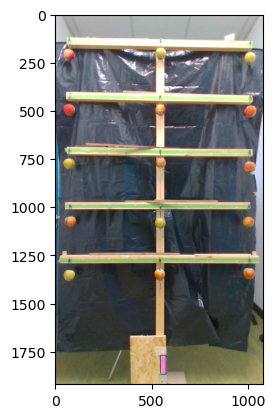

trunk coord - x, y, z : {'x_c': 547, 'y_c': 1869, 'z': 1528} pix  1528 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


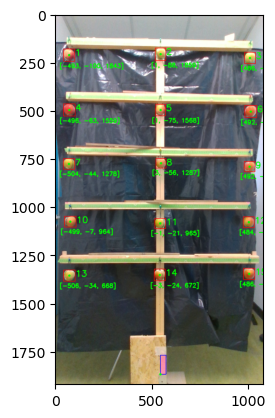

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_med_Leaves_img_2.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_med_Leaves_depth_2.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_med_Leaves_img_2.png


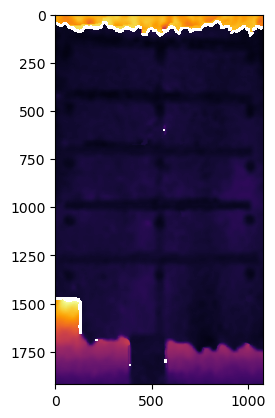

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

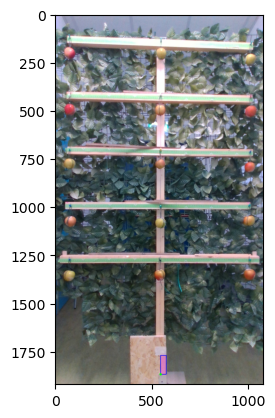

trunk coord - x, y, z : {'x_c': 548, 'y_c': 1869, 'z': 1511} pix  1511 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


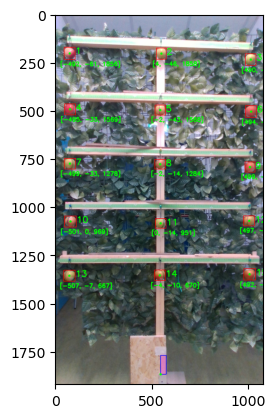

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_med_Leaves_img_3.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_med_Leaves_depth_3.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_med_Leaves_img_3.png


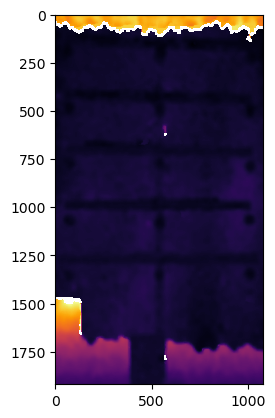

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

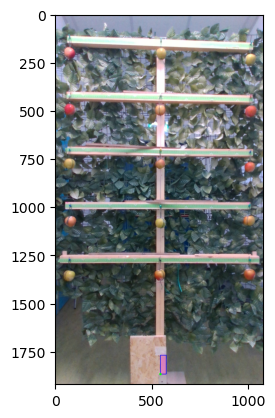

trunk coord - x, y, z : {'x_c': 547, 'y_c': 1868, 'z': 1514} pix  1514 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


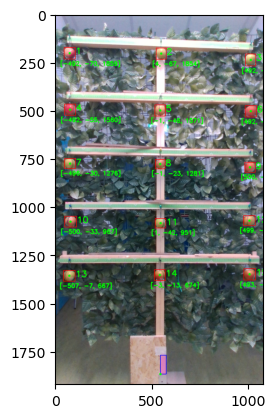

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_med_Leaves_img_4.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_med_Leaves_depth_4.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_med_Leaves_img_4.png


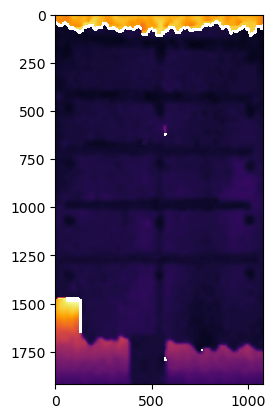

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

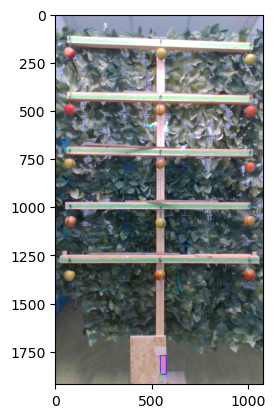

trunk coord - x, y, z : {'x_c': 547, 'y_c': 1870, 'z': 1507} pix  1507 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


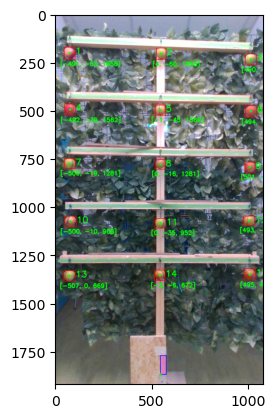

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_mix_Black_img_2.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_mix_Black_depth_2.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_mix_Black_img_2.png


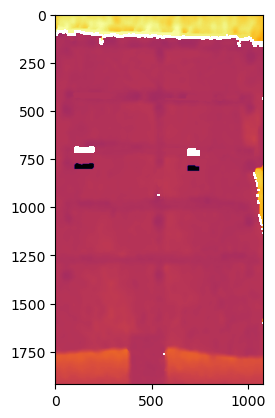

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

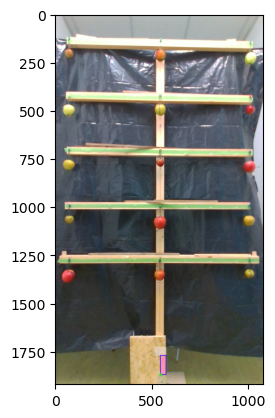

trunk coord - x, y, z : {'x_c': 547, 'y_c': 1871, 'z': 1521} pix  1521 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


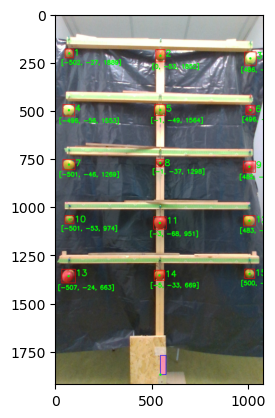

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_mix_Black_img_3.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_mix_Black_depth_3.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_mix_Black_img_3.png


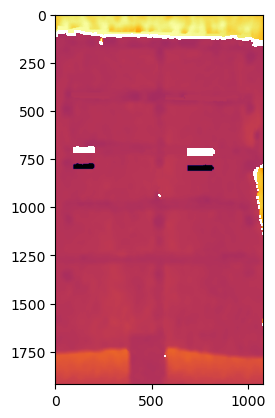

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

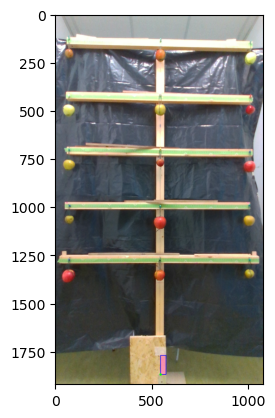

trunk coord - x, y, z : {'x_c': 548, 'y_c': 1870, 'z': 1517} pix  1517 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


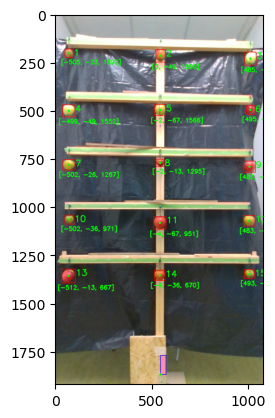

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_mix_Black_img_4.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_mix_Black_depth_4.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_mix_Black_img_4.png


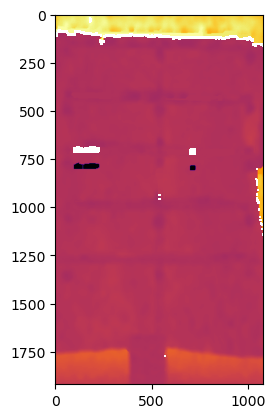

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

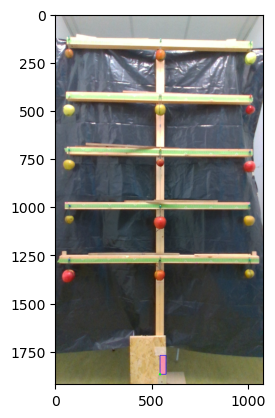

trunk coord - x, y, z : {'x_c': 545, 'y_c': 1869, 'z': 1517} pix  1517 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


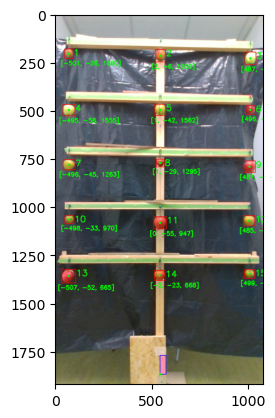

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_mix_Leaves_img_2.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_mix_Leaves_depth_2.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_mix_Leaves_img_2.png


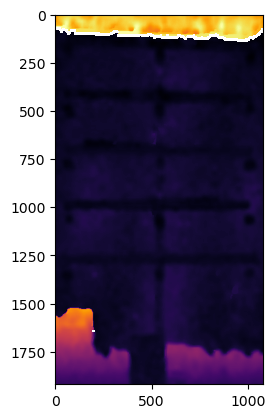

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

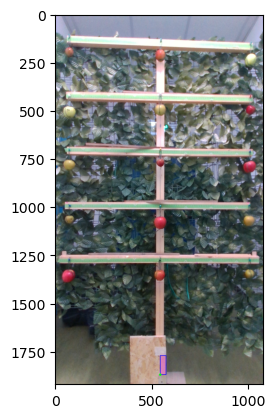

trunk coord - x, y, z : {'x_c': 546, 'y_c': 1871, 'z': 1521} pix  1521 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


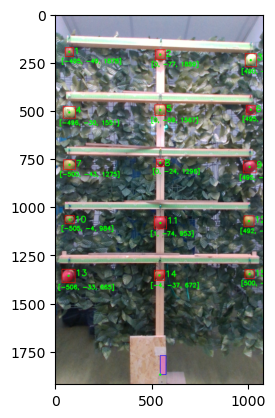

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_mix_Leaves_img_3.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_mix_Leaves_depth_3.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_mix_Leaves_img_3.png


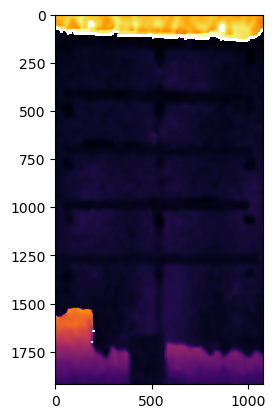

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

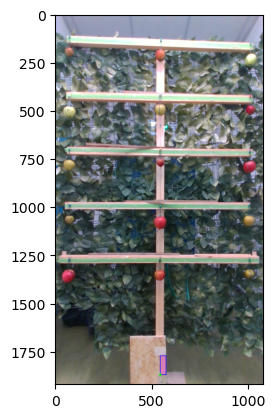

trunk coord - x, y, z : {'x_c': 546, 'y_c': 1871, 'z': 1524} pix  1524 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


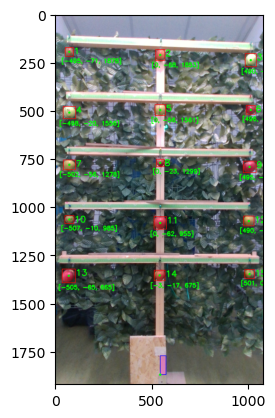

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_mix_Leaves_img_4.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_mix_Leaves_depth_4.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_mix_Leaves_img_4.png


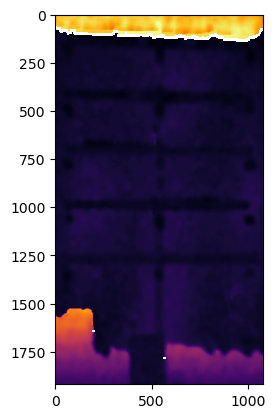

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

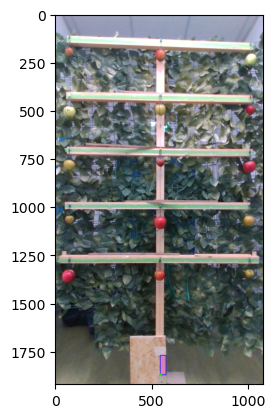

trunk coord - x, y, z : {'x_c': 546, 'y_c': 1872, 'z': 1545} pix  1545 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


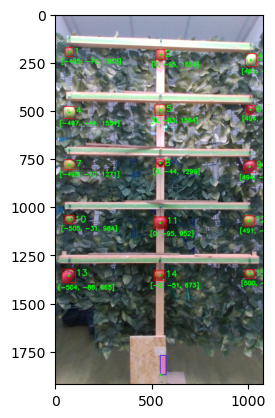

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_small_Black_img_2.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_small_Black_depth_2.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_small_Black_img_2.png


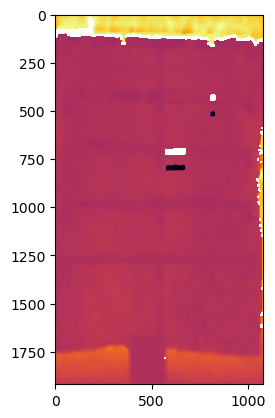

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

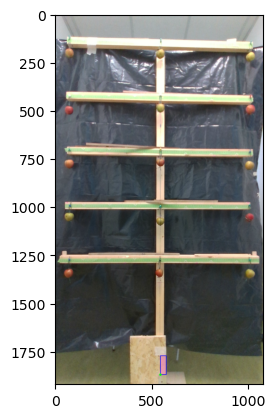

trunk coord - x, y, z : {'x_c': 547, 'y_c': 1871, 'z': 1528} pix  1528 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


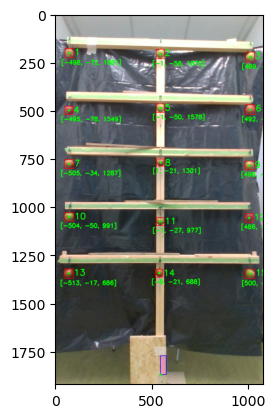

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_small_Black_img_3.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_small_Black_depth_3.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_small_Black_img_3.png


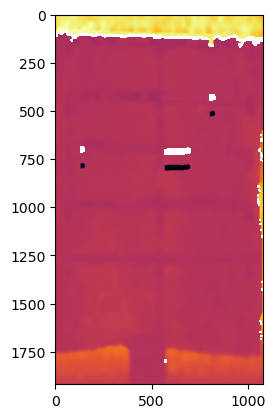

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

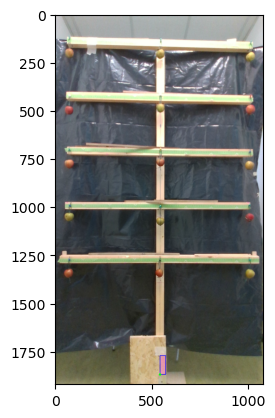

trunk coord - x, y, z : {'x_c': 545, 'y_c': 1870, 'z': 1524} pix  1524 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


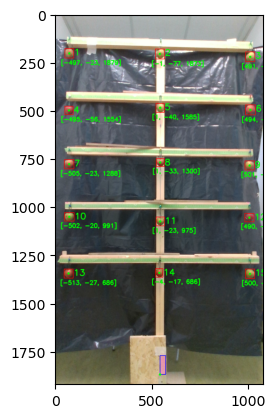

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_small_Black_img_4.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_small_Black_depth_4.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_small_Black_img_4.png


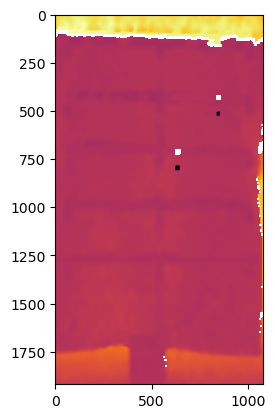

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

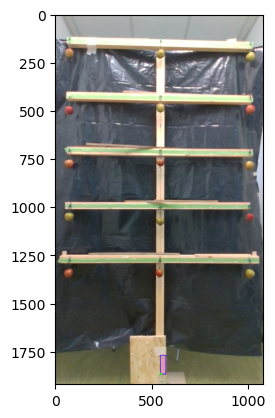

trunk coord - x, y, z : {'x_c': 547, 'y_c': 1868, 'z': 1507} pix  1507 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


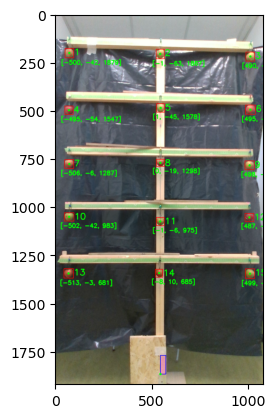

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_small_Leaves_img_2.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_small_Leaves_depth_2.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_small_Leaves_img_2.png


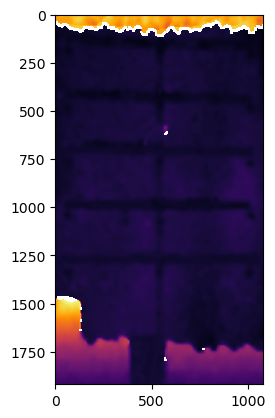

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

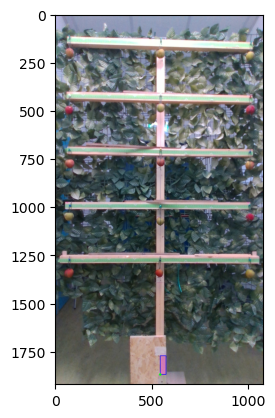

trunk coord - x, y, z : {'x_c': 546, 'y_c': 1870, 'z': 1517} pix  1517 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


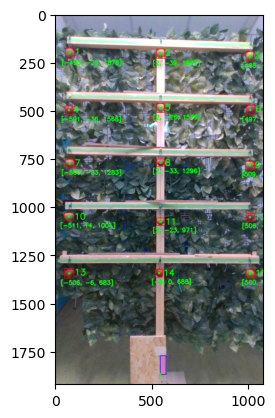

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_small_Leaves_img_3.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_small_Leaves_depth_3.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_small_Leaves_img_3.png


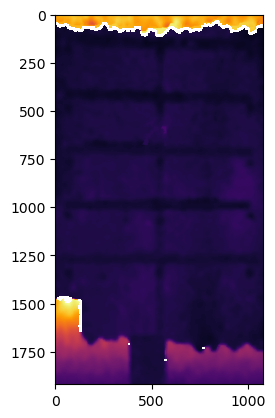

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

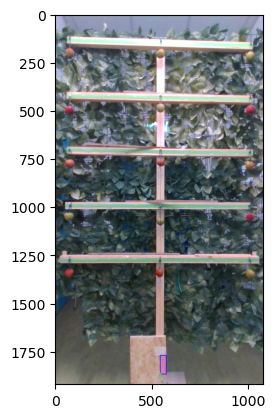

trunk coord - x, y, z : {'x_c': 546, 'y_c': 1868, 'z': 1521} pix  1521 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


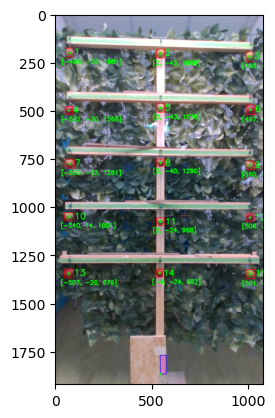

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Apple_2d_small_Leaves_img_4.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_small_Leaves_depth_4.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Apple_2d_small_Leaves_img_4.png


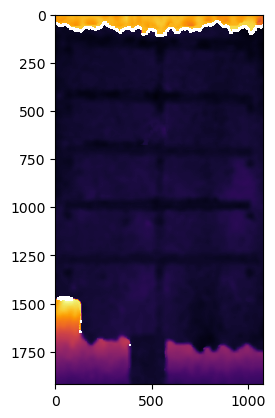

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

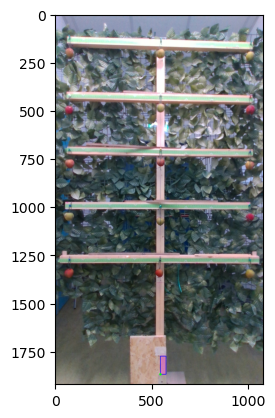

trunk coord - x, y, z : {'x_c': 547, 'y_c': 1869, 'z': 1535} pix  1535 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


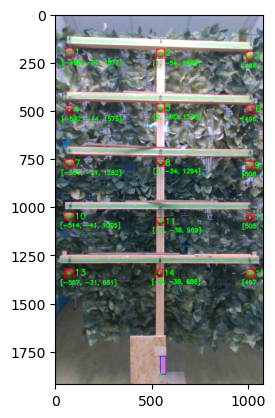

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Mix_2d_apple_tball_Leaves_img_2.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Mix_2d_apple_tball_Leaves_depth_2.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Mix_2d_apple_tball_Leaves_img_2.png


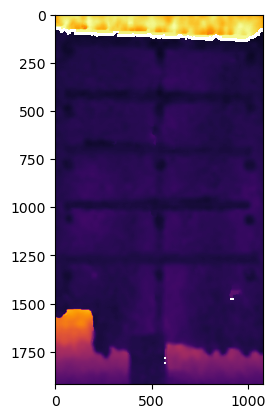

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

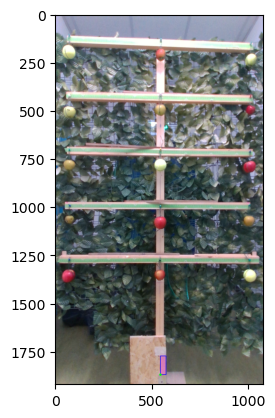

trunk coord - x, y, z : {'x_c': 547, 'y_c': 1871, 'z': 1545} pix  1545 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


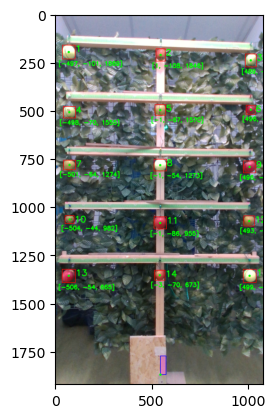

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Mix_2d_apple_tball_Leaves_img_3.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Mix_2d_apple_tball_Leaves_depth_3.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Mix_2d_apple_tball_Leaves_img_3.png


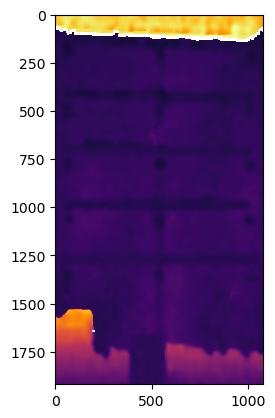

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

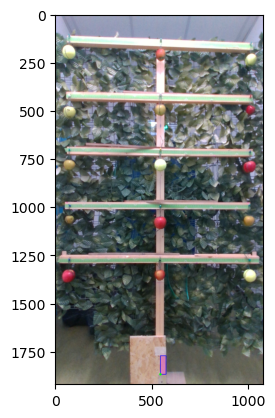

trunk coord - x, y, z : {'x_c': 547, 'y_c': 1869, 'z': 1528} pix  1528 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


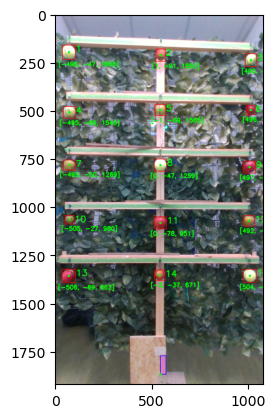

end tree
lab= 'C:\\Users\\gianm\\Desktop\\AGRARIA_LAVORO\\2024\\Tesi\\Agnes_23-24_SHEET_pos-size-persp\\2023.08.03_Apple_Sizing_Agnes\\CODE_Data\\2d\\Mix_2d_apple_tball_Leaves_img_4.png.json'
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Mix_2d_apple_tball_Leaves_depth_4.png
---------------
 C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d\Mix_2d_apple_tball_Leaves_img_4.png


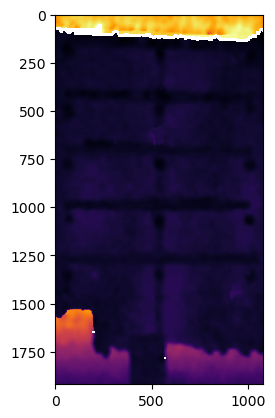

CAMERA ORIENTATION: V - 1081 x 1920


C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:86: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
C:\Users\gianm\AppData\Local\Temp\ipykernel_4120\1978435297.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

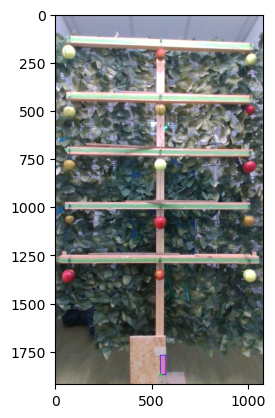

trunk coord - x, y, z : {'x_c': 547, 'y_c': 1871, 'z': 1545} pix  1545 mm
Sizing fruit obj_id= '1'
Sizing fruit obj_id= '2'
Sizing fruit obj_id= '3'
Sizing fruit obj_id= '4'
Sizing fruit obj_id= '5'
Sizing fruit obj_id= '6'
Sizing fruit obj_id= '7'
Sizing fruit obj_id= '8'
Sizing fruit obj_id= '9'
Sizing fruit obj_id= '10'
Sizing fruit obj_id= '11'
Sizing fruit obj_id= '12'
Sizing fruit obj_id= '13'
Sizing fruit obj_id= '14'
Sizing fruit obj_id= '15'


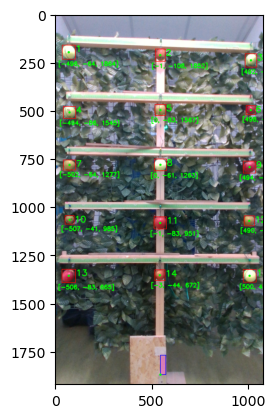

end tree


In [5]:
# ----------- DEFINE INITIAL VARIABLES
# field COLOUR images
IMAGE_FORMAT = 'png'
RGB_PATH = r"C:\Users\gianm\Desktop\AGRARIA_LAVORO\2024\Tesi\Agnes_23-24_SHEET_pos-size-persp\2023.08.03_Apple_Sizing_Agnes\CODE_Data\2d"

# PATH TO DEPTH IMAGES
DEPTH_PATH = RGB_PATH
depth_path = DEPTH_PATH

# path to yolo detected fruits labels
FRUIT_DETECT_YOLO_LABELS_PATH = RGB_PATH

# path to yolo detected trunk labels
TRUNK_DETECT_YOLO_LABELS_PATH = RGB_PATH

# final database containing desired information
OUTPUT_DF_PATH = RGB_PATH + '\\Estimated_position_IEE_2024.csv' 
out_df = OUTPUT_DF_PATH
print(f'Output filepath: {OUTPUT_DF_PATH}')

# path list of images to be analysed
rgb_imgs = glob.glob(RGB_PATH + '\\*.' + IMAGE_FORMAT)
df_labels= glob.glob(FRUIT_DETECT_YOLO_LABELS_PATH + '\\*' + '.json')

# initialise the database for storing info
df = pd.DataFrame(columns=[
            'name', 'Label', 'obj_posID',
            'fruit_camera_d_mm', 'Fr_Cam_d_med_mm','Fr_Cam_d_mean_mm',
            'pix_mm',
             'real_x_distance_mm', 'real_y_distance_mm', 'real_z_distance_mm'
           # 'bbox_ave_mm', 'bbox_min_mm', 'bbox_max_mm','Fr_size_mm',  
    ])

id_track = 0  # for building the df
id_tree = 0  # for tree tracking

print(df_labels)

# ---- First LOOP EACH LABEL FILE present in the folder 
for lab in df_labels:
    print(f'{lab= }')
    #----- GET FILES related with label file
    fn, depth = get_rel_fns(lab, depth_path=depth_path)
    depth = depth[:-4]
    print('---------------\n',depth)
   
    color_img =str(lab[:-5])
    print('---------------\n',color_img)

    color_img = cv2.imread(color_img)
    # print(f'{color_img.shape= }')

    # open related DEPTH MAP and filter
    depth_img = cv2.imread(depth, cv2.IMREAD_ANYDEPTH)
    depth_img = np.where(depth_img == 0, np.nan, depth_img) #filter for zeros
    depth_img = np.where(depth_img > 3000, np.nan, depth_img) #filter for excessive distances
    # print(f'{depth_img.shape= }')

    plt.imshow(depth_img, cmap='inferno')
    plt.show()
    # plt.imshow(color_img[:,:,::-1])
    # plt.show()
        
    #---- GETTING LABELS COORDS AND IMAGE INFO for the labels file in loop
    df_labels =  process_supervisely_json(lab)

    # getting camera ORIENTATION 
    im_w, im_h = df_labels['img_w'][0] , df_labels['img_h'][0]
    
    if im_w > im_h: 
        ORIENTATION = 'H'
    elif im_w < im_h:
        ORIENTATION = 'V'
    if im_w == im_h:
        ORIENTATION = 'SQUARE_RES'
    print(f'CAMERA ORIENTATION: {ORIENTATION} - {im_w} x {im_h}')

    # create different annotations DF based on the LABEL
    df_fruits = df_labels[df_labels['label'] != 'Trunk'].copy()
    df_trunk= df_labels[df_labels['label'] == 'Trunk' ].copy()
    # display(df_fruits)
#     display(df_trunk)

#   # ---- GETTING TRUNK POSITION
    # getting the trunk depth image roi
    x1_t, x2_t = int(df_trunk['x_1'].values) , int(df_trunk['x_2'].values)
    y1_t, y2_t = int(df_trunk['y_1'].values) , int(df_trunk['y_2'].values)
    xc_t, yc_t  = int(df_trunk['x_c_abs'].values) , int(df_trunk['y_c_abs'].values)
    
    trunk_d_img = depth_img[y1_t:y2_t, x1_t:x2_t]

    # get trunk distance as the most frequent z_values distance value
    unique_values, counts = np.unique(trunk_d_img[trunk_d_img!=0].flatten(), return_counts=True)
    max_count = np.max(counts)
    frequent_values = unique_values[counts == max_count]
    if np.isnan(frequent_values[0]):
        # Get the second most frequent value
        second_max_count = np.sort(counts)[-2]  # Get the second highest frequency
        second_frequent_values = unique_values[counts == second_max_count]
        # Use the second most frequent value
        camera_trunk_dist_occ = int(second_frequent_values[0])
    else:
        # Use the most frequent value
        camera_trunk_dist_occ = int(frequent_values[0])
    # print(f'trunk: {unique_values= } {counts= }') 
    # print(f'occurency: {camera_trunk_dist_occ= } ') 

   # get trunk distance as the median (reducing outliers effect)of all z_values distance value
    camera_trunk_dist_med = round(np.nanmedian(trunk_d_img))
    camera_trunk_dist_mean = round(np.nanmean(trunk_d_img))
    # print(f'median: {camera_trunk_dist_med= } ') 

   # define the wanted methods to estimate trunk distances
    camera_trunk_dist = camera_trunk_dist_occ # camera_trunk_dist_med
    # print(f'{camera_trunk_dist= }')

    # ---Draw Trunk bbox  a the dot representing the "origin" on the image
    viz = color_img[..., ::-1].copy()
    viz_d = depth_img.copy()
    # Draw bounding box on color image
    cv2.rectangle(viz, (x1_t, y1_t), (x2_t, y2_t), (0, 0, 255), 2)  # BGR color format (red), thickness=2
    cv2.circle(viz, (x1_t, y2_t), radius=6, color=(0, 255, 0), thickness=-1)
    # Display color image with bounding box
    plt.imshow(viz)
    plt.show()

    #----TRUNK COORD OBTAINED: store trunk coords into a dict
    trunk_coords = {'x_c': x1_t, 'y_c': y2_t, 'z':camera_trunk_dist}
    print('trunk coord - x, y, z :', trunk_coords,'pix ',camera_trunk_dist, 'mm'  )

    # ---- Second LOOP EACH DETECTION in the label file 
    for idx, row in df_fruits.iterrows():
        # ---- GET FRUITS BBOX COORDS from yolo.json
        x_min = row['x_1']
        x_max = row['x_2']
        y_min = row['y_1']
        y_max = row['y_2']
        x_c = row['x_c_abs']
        y_c = row['y_c_abs']
        # print( x_min, x_max, y_min, y_max)
        
        # get obj id (manually tag during labelling)
        obj_id = row['Tag']
        label = row['label']
        print('Sizing fruit', f'{obj_id= }')

        # draw fruit bbox
        cv2.rectangle(viz, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)  # BGR color format (red), thickness=2
        cv2.circle(viz, (x_c, y_c), radius=6, color=(0, 255, 0), thickness=-1)
        # print fruit ID on the image
        font = cv2.FONT_HERSHEY_SIMPLEX
        scale, thickness, color = 1.5 , 3 , (0, 255, 0)
        text_size = cv2.getTextSize(obj_id, font, scale, thickness)[0] # Get the size of the text
        text_x, text_y = (x_max +2) , (y_min + text_size[1])# Calculate the position to center the text
        cv2.putText(viz, obj_id, (text_x, text_y), font, scale, color, thickness) # Add the text to the image

        # ---- FRUIT 3D POSITIONING
        mm_pix, m_fd, m_fd_med,m_fd_mean,real_x_distance_mm, real_y_distance_mm, real_z_distance_mm = xyz_positioning_json(depth_img, row, trunk_d_img, trunk_coords, ORIENTATION)
        # print text on image
        text =str([real_x_distance_mm, real_y_distance_mm, real_z_distance_mm])
        text_x, text_y = (x_min -20) , (y_max + text_size[1])
        cv2.putText(viz, text, (text_x, text_y), font, 1, color, thickness)

        # ---- FRUIT SIZING
        # mm_pix, m_fd ,m_fd_med,m_fd_mean, fruit_size_mm,bbox_ave_mm, bbox_min_mm, bbox_max_mm = sizing_fruits(color_img,depth_img)  


        # ---- FILLING THE DATABASE
        df.loc[id_track] = ([fn , label , obj_id ,
                    m_fd , m_fd_med , m_fd_mean , 
                    mm_pix ,
                    real_x_distance_mm, real_y_distance_mm, real_z_distance_mm
                    # bbox_ave_mm, bbox_min_mm, bbox_max_mm,fruit_size_mm # sizing data
                    ])
        # print('')
                  
        id_track += 1
    
    plt.imshow(viz)
    plt.show()
    
    print('end tree')
    id_tree += 1000


# ---- SAVE THE DATASET
df.to_csv(out_df, sep=';', index=False)

pd.read_csv(r'C:\Users\gianm\Desktop\AGRARIA_LAVORO\2023\Tesi\Agnes_SHEET_posizionamento-sizing_mele\2023.08.03_Apple_Sizing_Agnes\CODE\test_area\output_dataset.csv')

In [34]:
df_final = pd.read_csv(out_df,sep=';')
df_final

,name,Label,objID,fruit_camera_d_mm,Fr_Cam_d_med_mm,Fr_Cam_d_mean_mm,pix_mm,bbox_ave_mm,bbox_min_mm,bbox_max_mm,Fr_size_mm
0,Perspective_apple_d1_h1_img_1.,Apple,1.0,898,906,915,0.640619,65,60,70,60.22
1,Perspective_apple_d1_h1_img_1.,Apple,2.0,889,907,920,0.634198,64,60,67,NaN
2,Perspective_apple_d1_h1_img_1.,Apple,3.0,889,911,921,0.634198,61,60,63,67.22
3,Perspective_apple_d1_h1_img_1.,Apple,4.0,893,912,925,0.637052,59,58,59,66.25
4,Perspective_apple_d1_h1_img_1.,Apple,5.0,910,921,929,0.649179,63,62,63,66.22
...,...,...,...,...,...,...,...,...,...,...,...
427,Perspective_tball_d3_h3_img_2.,Tennis_ball,5.0,1941,1947,1950,1.384678,66,64,68,66.46
428,Perspective_tball_d3_h3_img_2.,Tennis_ball,6.0,1964,1952,1950,1.401086,71,71,71,70.05
429,Perspective_tball_d3_h3_img_2.,Tennis_ball,7.0,1952,1958,1965,1.392526,71,68,74,69.63
430,Perspective_tball_d3_h3_img_2.,Tennis_ball,8.0,1975,1975,1978,1.408933,70,69,72,70.45


# DATA ANALISYS

In [ ]:
df_final = pd.read_csv(out_df,sep=';')
df_final